<h1> <center> Chronic Kidney Disease classification 

#  Team members: 

##     Meshari Alkhaldi        201686420
    
##     Bandar Alsuhibani       201443480

# Dataset description:

#### Chronic Kidney Disease (CKD) is a long-term disease that impacts the kidneys, damages them, and extends to the overall health by impacting other vital organs as complications. Those complications could be in the form of high Blood_Pressure, low red cells count in the blood or as known as anemia, nerve damage, and weak bones. CKD can be treated to prevent such complications by early detection and treatment. In this CKD dataset, there are 25 features and only one target variable; which will be more clear later on. 

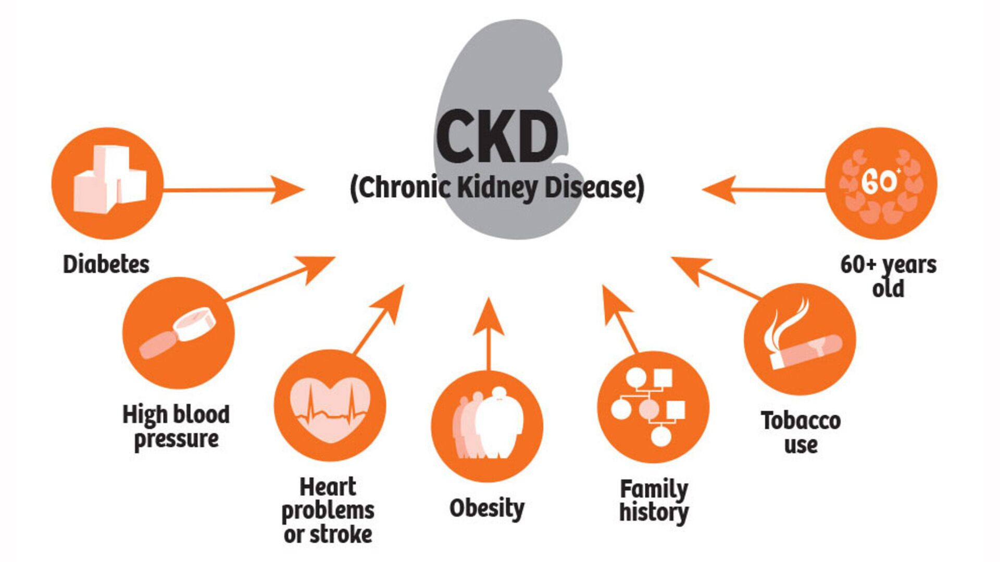

## Importing needed packages:

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, plot_confusion_matrix, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

## Before importing the dataset, let us explain some of the abbreviation of our 25 features: 

age: Age 

bp: Blood_Pressure 

sg: Specific_Gravity

al: Albumin

su: Sugar

rbc: Red_Blood_Cells

pc: Pus_Cell

pcc: Pus_Cell Clumps

ba: Bacteria

bgr: Blood_Glucose_Random

bu: Blood_Urea

sc: Serum_Creatinine

sod: Sodium

pot: Potassium

hemo: Hemoglobin

pcv: Packed_Cell_Volume

wc: White_Blood_Cell_Count

rc: Red_Blood_Cell_Count

htn: Hypertension

dm: Diabetes_Mellitus

cad: Coronary_Artery_Disease

appet: Appetite

pe: Pedal_Edema

ane: Anemia

classification: Class ( the target features)

## Importing the CKD dataset:

In [2]:
df = pd.read_csv('CKD dataset.csv')
# The next line will display the head of the dataset to make sure we have the right one..
df.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [3]:
# The next line will display the number of rows and columns of the dataset..
df.shape

(400, 26)

In [4]:
# This line will display the information of the dataset..
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

### Now, we can notice that some of the columns' names do not make sense. So in the next lines, we will rename some of the columns to give it a meaningful names.. 

In [5]:
col={'id':'Id',"age":'Age',"bp":"Blood_Pressure",
          "sg":"Specific_Gravity",
          "al":"Albumin",
          "su":"Sugar",
          "rbc":"Red_Blood_Cells",
          "pc":"Pus_Cell",
          "pcc":"Pus_Cell_Clumps",
          "ba":"Bacteria",
          "bgr":"Blood_Glucose_Random",
          "bu":"Blood_Urea",
          "sc":"Serum_Creatinine",
          "sod":"Sodium",
          "pot":"Potassium",
          "hemo":"Hemoglobin",
          "pcv":"Packed_Cell_Volume",
          "wc":"White_Blood_Cell_Count",
          "rc":"Red_Blood_Cell_Count",
          "htn":"Hypertension",
          "dm":"Diabetes_Mellitus",
          "cad":"Coronary_Artery_Disease",
          "appet":"Appetite",
          "pe":"Pedal_Edema",
          "ane":"Anemia"}

df.rename(columns=col , inplace=True)
df.columns # This line will display the new names

Index(['Id', 'Age', 'Blood_Pressure', 'Specific_Gravity', 'Albumin', 'Sugar',
       'Red_Blood_Cells', 'Pus_Cell', 'Pus_Cell_Clumps', 'Bacteria',
       'Blood_Glucose_Random', 'Blood_Urea', 'Serum_Creatinine', 'Sodium',
       'Potassium', 'Hemoglobin', 'Packed_Cell_Volume',
       'White_Blood_Cell_Count', 'Red_Blood_Cell_Count', 'Hypertension',
       'Diabetes_Mellitus', 'Coronary_Artery_Disease', 'Appetite',
       'Pedal_Edema', 'Anemia', 'classification'],
      dtype='object')

## Another observation we can make is that some of the features are written as objects or a yes/no type. This must change to numarical values in order to proceeds to the final target. In other words, we must do dataset manipulation. 

In [6]:
# First, we find all the unique values of type "object" for all the colmuns: 
for i in df.select_dtypes(include=['object']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')

Red_Blood_Cells has unique values [nan 'normal' 'abnormal'] 

Pus_Cell has unique values ['normal' 'abnormal' nan] 

Pus_Cell_Clumps has unique values ['notpresent' 'present' nan] 

Bacteria has unique values ['notpresent' 'present' nan] 

Packed_Cell_Volume has unique values ['44' '38' '31' '32' '35' '39' '36' '33' '29' '28' nan '16' '24' '37' '30'
 '34' '40' '45' '27' '48' '\t?' '52' '14' '22' '18' '42' '17' '46' '23'
 '19' '25' '41' '26' '15' '21' '43' '20' '\t43' '47' '9' '49' '50' '53'
 '51' '54'] 

White_Blood_Cell_Count has unique values ['7800' '6000' '7500' '6700' '7300' nan '6900' '9600' '12100' '4500'
 '12200' '11000' '3800' '11400' '5300' '9200' '6200' '8300' '8400' '10300'
 '9800' '9100' '7900' '6400' '8600' '18900' '21600' '4300' '8500' '11300'
 '7200' '7700' '14600' '6300' '\t6200' '7100' '11800' '9400' '5500' '5800'
 '13200' '12500' '5600' '7000' '11900' '10400' '10700' '12700' '6800'
 '6500' '13600' '10200' '9000' '14900' '8200' '15200' '5000' '16300'
 '12400' '\t8400'

In [7]:
# Second, we find all the unique values of type "float64" for all the colmuns: 
for i in df.select_dtypes(include=['float64']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')

Age has unique values [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.] 

Blood_Pressure has unique values [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.] 

Specific_Gravity has unique values [1.02  1.01  1.005 1.015   nan 1.025] 

Albumin has unique values [ 1.  4.  2.  3.  0. nan  5.] 

Sugar has unique values [ 0.  3.  4.  1. nan  2.  5.] 

Blood_Glucose_Random has unique values [121.  nan 423. 117. 106.  74. 100. 410. 138.  70. 490. 380. 208.  98.
 157.  76.  99. 114. 263. 173.  95. 108. 156. 264. 123.  93. 107. 159.
 140. 171. 270.  92. 137. 204.  79. 207. 124. 144.  91. 162. 246. 253.
 141. 182.  86. 150. 146. 425. 112. 250. 360. 163. 129. 133. 102. 158.
 165. 132. 104. 127. 415. 169. 251. 109. 280. 210. 219. 29

In [8]:
# Finally, we change the object values to numarical dtype or float values: 
df['Red_Blood_Cell_Count']  = pd.to_numeric(df['Red_Blood_Cell_Count'], errors='coerce')
df['White_Blood_Cell_Count'] = pd.to_numeric(df['White_Blood_Cell_Count'], errors='coerce')
df['Packed_Cell_Volume'] = pd.to_numeric(df['Packed_Cell_Volume'], errors='coerce')

In [9]:
# Then, we display the information of the dataset after manipulating it to have meaningful names
# and all numarical dtype values:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Id                       400 non-null    int64  
 1   Age                      391 non-null    float64
 2   Blood_Pressure           388 non-null    float64
 3   Specific_Gravity         353 non-null    float64
 4   Albumin                  354 non-null    float64
 5   Sugar                    351 non-null    float64
 6   Red_Blood_Cells          248 non-null    object 
 7   Pus_Cell                 335 non-null    object 
 8   Pus_Cell_Clumps          396 non-null    object 
 9   Bacteria                 396 non-null    object 
 10  Blood_Glucose_Random     356 non-null    float64
 11  Blood_Urea               381 non-null    float64
 12  Serum_Creatinine         383 non-null    float64
 13  Sodium                   313 non-null    float64
 14  Potassium                3

## Additional observations we can notice is the incorrect values in the Coronary_Artery_Disease, Red/White_Blood_Cell_Count, and Packed_Cell_Volume, i.e., yes/no values. Further more, there are some obvious missing values as the Non-Null Count should be 400 for all of the features. We need to take some actions to fix such problems before proceeding.. 

In [10]:
# This code will modify the yes/no values and replace them into correct values:
df['classification'] = df['classification'].replace(to_replace = 'ckd\t', value='ckd')
df['Coronary_Artery_Disease'] = df['Coronary_Artery_Disease'].replace(to_replace = '\tno', value='no')
df['Diabetes_Mellitus'] = df['Coronary_Artery_Disease'].replace(to_replace = '\tno', value='no')
df['Diabetes_Mellitus'] = df['Coronary_Artery_Disease'].replace(to_replace='\tyes',value='yes')
df['Red_Blood_Cell_Count'] = df['Red_Blood_Cell_Count'].replace(to_replace='\t?',value=np.nan)
df['White_Blood_Cell_Count'] = df['White_Blood_Cell_Count'].replace(to_replace='\t6200',value='6200')
df['White_Blood_Cell_Count'] = df['White_Blood_Cell_Count'].replace(to_replace='\t8400',value='8400')
df['White_Blood_Cell_Count'] = df['Red_Blood_Cell_Count'].replace(to_replace='\t?',value=np.nan)
df['Packed_Cell_Volume'] = df['Packed_Cell_Volume'].replace(to_replace='\t?',value=np.nan)
df['Packed_Cell_Volume'] = df['Packed_Cell_Volume'].replace(to_replace='\t43',value='43')

In [11]:
# This line will look for the missing values in the dataset and display how many are missing from each feature:
df.isnull().sum().sort_values(ascending=False)

Red_Blood_Cells            152
Red_Blood_Cell_Count       131
White_Blood_Cell_Count     131
Potassium                   88
Sodium                      87
Packed_Cell_Volume          71
Pus_Cell                    65
Hemoglobin                  52
Sugar                       49
Specific_Gravity            47
Albumin                     46
Blood_Glucose_Random        44
Blood_Urea                  19
Serum_Creatinine            17
Blood_Pressure              12
Age                          9
Bacteria                     4
Pus_Cell_Clumps              4
Hypertension                 2
Diabetes_Mellitus            2
Coronary_Artery_Disease      2
Anemia                       1
Appetite                     1
Pedal_Edema                  1
Id                           0
classification               0
dtype: int64

In [12]:
# This line will display the missing values percentage in the dataset from each feature:
((df.isnull().sum()/df.shape[0])*100).sort_values(ascending=False)

Red_Blood_Cells            38.00
Red_Blood_Cell_Count       32.75
White_Blood_Cell_Count     32.75
Potassium                  22.00
Sodium                     21.75
Packed_Cell_Volume         17.75
Pus_Cell                   16.25
Hemoglobin                 13.00
Sugar                      12.25
Specific_Gravity           11.75
Albumin                    11.50
Blood_Glucose_Random       11.00
Blood_Urea                  4.75
Serum_Creatinine            4.25
Blood_Pressure              3.00
Age                         2.25
Bacteria                    1.00
Pus_Cell_Clumps             1.00
Hypertension                0.50
Diabetes_Mellitus           0.50
Coronary_Artery_Disease     0.50
Anemia                      0.25
Appetite                    0.25
Pedal_Edema                 0.25
Id                          0.00
classification              0.00
dtype: float64

<AxesSubplot:>

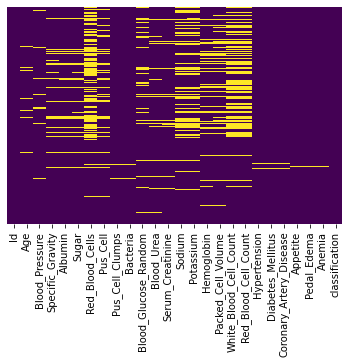

In [13]:
# This line will display a chart of the missing values for each feature: 
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

## To handle the missing values, we need to implement three steps: 
## 1. Drop the null value for the coulmns that contains less than 5 perecent
## 2. Fill the the numerical columns with the mean
## 3. Fill the category columns with the mode

In [14]:
# Step one: 
df.dropna(axis=0, subset=['Blood_Urea' , 'Serum_Creatinine','Blood_Pressure','Age','Bacteria','Pus_Cell_Clumps','Hypertension','Diabetes_Mellitus','Coronary_Artery_Disease','Anemia','Appetite','Pedal_Edema'],inplace=True)

In [15]:
# Step two: 
for i in df.select_dtypes(include=['float64']) :
    df[i].fillna(df[i].mean(),inplace=True)

In [16]:
# Step three: 
for i in df.select_dtypes(include=['object']) :
    df[i].fillna(df[i].mode()[0],inplace=True)

## Let us have a look at the dataset's values after all this modification: 

In [17]:
df.shape

(355, 26)

## Now, we need to make sure that our dataset do not have outliers and if so, we need to deal with them.. 

In [18]:
# This code will check for any outliers:
from collections import Counter
def outliers(df,features):
    outlier_indices=[]
    
    for c in features:
        Q1=np.percentile(df[c],25) #1st quartile
        Q3=np.percentile(df[c],75) #3rd quartile
        IQR=Q3-Q1                  #IQR
        outlier_step=IQR*1.5       #Outlier step
        # The next line will detect outliers and their indeces
        outlier_list_col=df[(df[c]<Q1-outlier_step) | (df[c]>Q3 + outlier_step)].index 
        outlier_indices.extend(outlier_list_col) 
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers=list(i for i,v in outlier_indices.items() if v>2)
    
    return multiple_outliers

df.loc[outliers(df,df.select_dtypes(include=['float64']))]

,Id,Age,Blood_Pressure,Specific_Gravity,Albumin,Sugar,Red_Blood_Cells,Pus_Cell,Pus_Cell_Clumps,Bacteria,...,Packed_Cell_Volume,White_Blood_Cell_Count,Red_Blood_Cell_Count,Hypertension,Diabetes_Mellitus,Coronary_Artery_Disease,Appetite,Pedal_Edema,Anemia,classification
18,18,60.0,100.0,1.025000,0.000000,3.000000,normal,normal,notpresent,notpresent,...,37.000000,4.300000,4.300000,yes,yes,yes,good,no,no,ckd
90,90,63.0,100.0,1.010000,2.000000,2.000000,normal,normal,notpresent,present,...,40.000000,4.200000,4.200000,yes,yes,yes,good,no,no,ckd
93,93,73.0,100.0,1.010000,3.000000,2.000000,abnormal,abnormal,present,notpresent,...,30.000000,3.200000,3.200000,yes,yes,yes,poor,no,no,ckd
98,98,50.0,140.0,1.017524,1.034921,0.467949,normal,normal,notpresent,notpresent,...,18.000000,2.300000,2.300000,yes,no,no,poor,no,yes,ckd
99,99,56.0,180.0,1.017524,0.000000,4.000000,normal,abnormal,notpresent,notpresent,...,32.000000,4.200000,4.200000,yes,no,no,poor,yes,no,ckd
107,107,55.0,100.0,1.015000,1.000000,4.000000,normal,normal,notpresent,notpresent,...,34.000000,4.400000,4.400000,yes,no,no,good,no,no,ckd
133,133,70.0,100.0,1.015000,4.000000,0.000000,normal,normal,notpresent,notpresent,...,37.000000,8.000000,8.000000,yes,no,no,good,no,no,ckd
175,175,60.0,50.0,1.010000,0.000000,0.000000,normal,normal,notpresent,notpresent,...,38.841751,3.400000,3.400000,yes,no,no,good,no,no,ckd
196,196,49.0,100.0,1.010000,3.000000,0.000000,abnormal,abnormal,notpresent,notpresent,...,24.000000,3.500000,3.500000,yes,no,no,poor,yes,yes,ckd
198,198,59.0,100.0,1.020000,4.000000,2.000000,normal,normal,notpresent,notpresent,...,30.000000,3.900000,3.900000,yes,no,no,poor,yes,no,ckd


## So far, we have managed to perform necessary changes to the dataset and everything looks good. Let's move forward to the next step..

## Let's take a look at the dataset by displaying a description of it:  

In [19]:
# This line will display a description the data:
df.describe()

,Id,Age,Blood_Pressure,Specific_Gravity,Albumin,Sugar,Blood_Glucose_Random,Blood_Urea,Serum_Creatinine,Sodium,Potassium,Hemoglobin,Packed_Cell_Volume,White_Blood_Cell_Count,Red_Blood_Cell_Count
count,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000
mean,200.600000,52.490141,76.676056,1.017524,1.034921,0.467949,148.134146,57.887887,3.080704,137.419861,4.652098,12.525240,38.841751,4.679268,4.679268
std,117.657686,16.228133,13.908270,0.005383,1.285090,1.054556,75.554188,51.027094,5.855687,9.691667,2.986842,2.744008,8.251958,0.859583,0.859583
min,0.000000,5.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000,9.000000,2.100000,2.100000
25%,97.500000,43.000000,70.000000,1.015000,0.000000,0.000000,100.000000,27.000000,0.900000,135.000000,3.900000,10.850000,33.500000,4.400000,4.400000
50%,201.000000,55.000000,80.000000,1.017524,1.000000,0.000000,124.000000,42.000000,1.300000,137.419861,4.652098,12.525240,38.841751,4.679268,4.679268
75%,304.500000,65.000000,80.000000,1.020000,2.000000,0.467949,156.500000,66.000000,2.800000,141.000000,4.800000,14.650000,44.000000,5.100000,5.100000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000,54.000000,8.000000,8.000000


## Now we need to visualize the data to perform some analysis: 

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


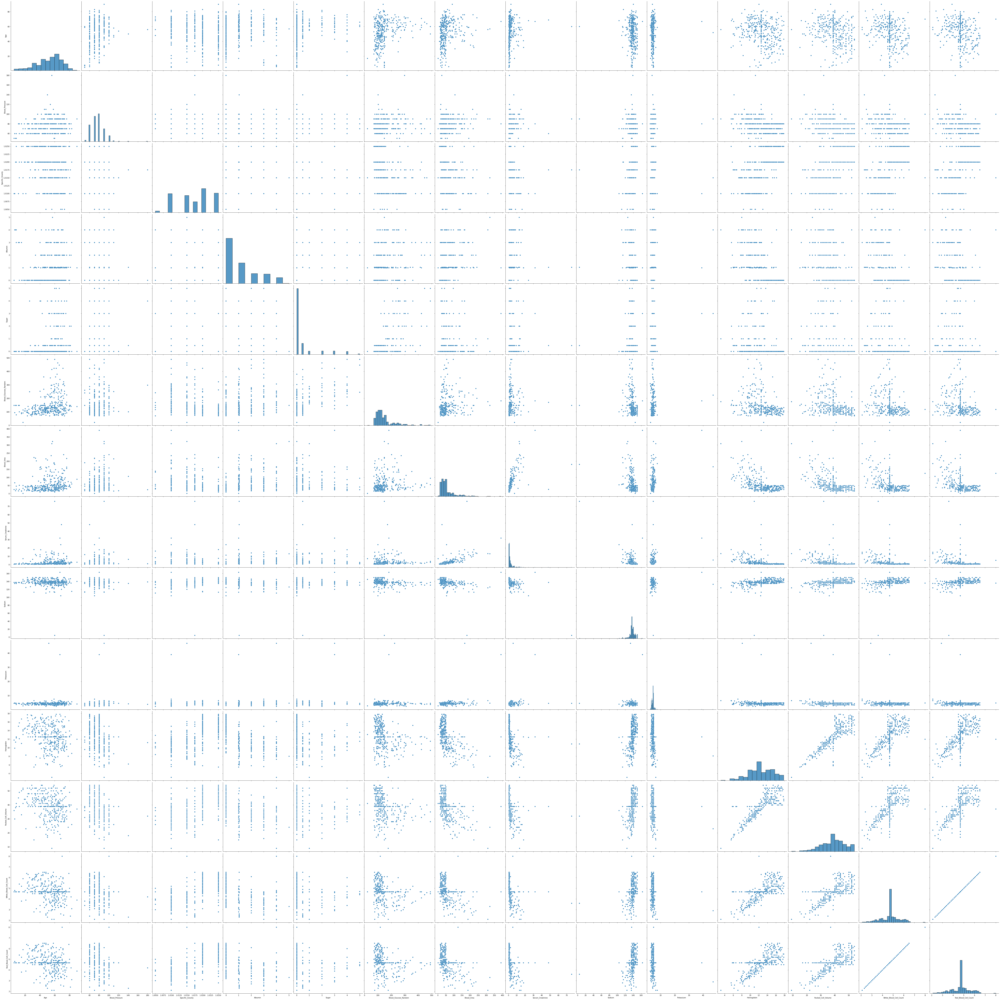

In [20]:
# This line will look for pairwise relationships in a dataset:
sns.pairplot(df.select_dtypes(include=['float64']),size=6,height=3)

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:1699: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.2 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)
/Users/meshari/opt/anacon

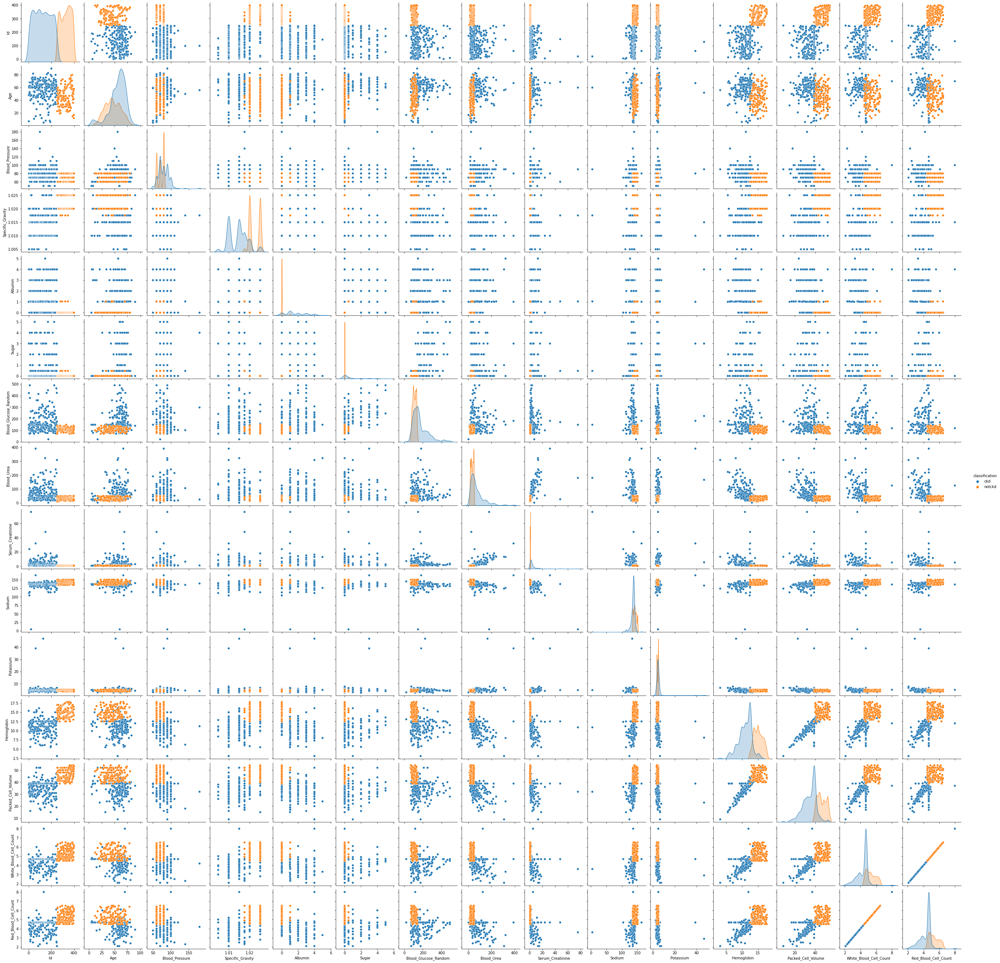

In [21]:
# This line will look for pairwise relationships in the dataset and use variable classification in huename 
# to aspects the different colors: 
sns.pairplot(df,hue='classification',diag_kws={'bw': 0.2})

In [22]:
# This line will do sorting to the values by age:
df.sort_values(by=["Age"],inplace=True)

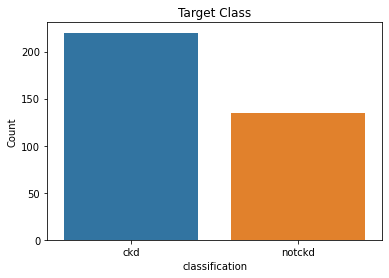

Percent of Chronic Kidney Disease sample:  61.97 %
Percent of not a Chronic Kidney Disease sample:  38.03 %


In [23]:
# This code will display the chart and the percentage of the CKD sample in the dataset: 
sns.countplot(x='classification',data=df)
plt.xlabel("classification")
plt.ylabel("Count")
plt.title("Target Class")
plt.show()
print('Percent of Chronic Kidney Disease sample: ',round(len(df[df['classification']=='ckd'])/len(df['classification'])*100,2),"%")
print('Percent of not a Chronic Kidney Disease sample: ',round(len(df[df['classification']=='notckd'])/len(df['classification'])*100,2),"%")

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


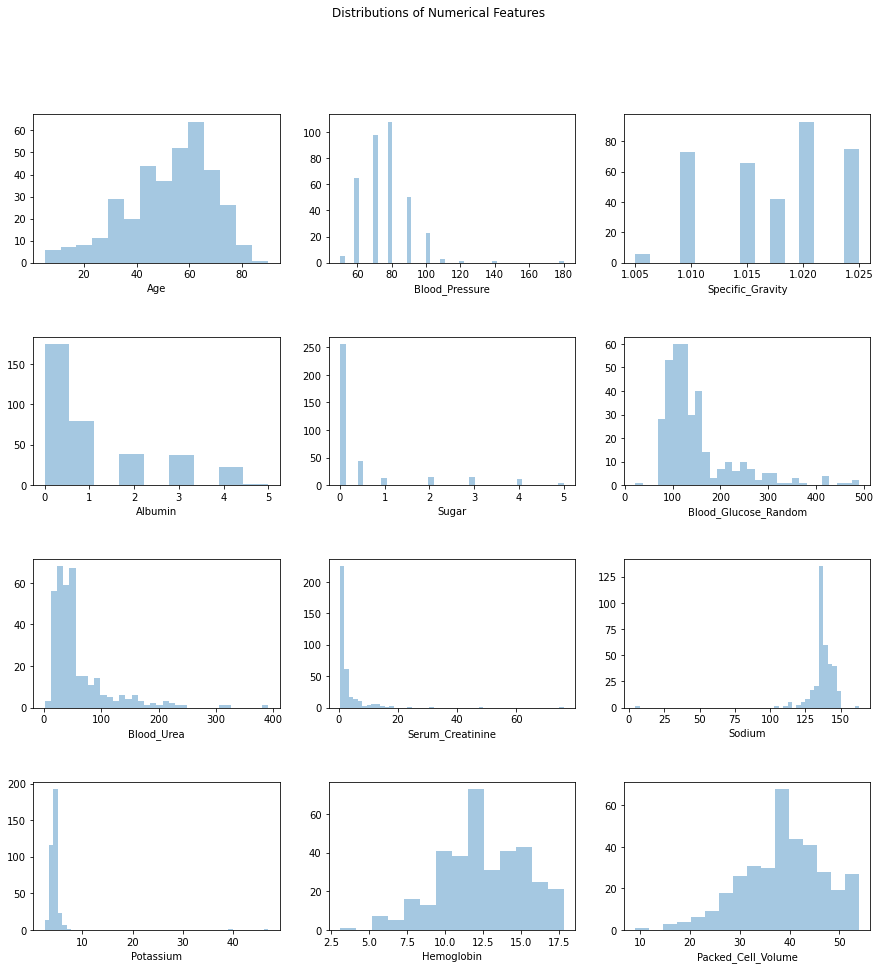

In [24]:
# This code will display the charts of the numarical features distribuation: 
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of Numerical Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['float64'])):
    sns.distplot(a=df[feats], ax=ax , kde=False)

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will

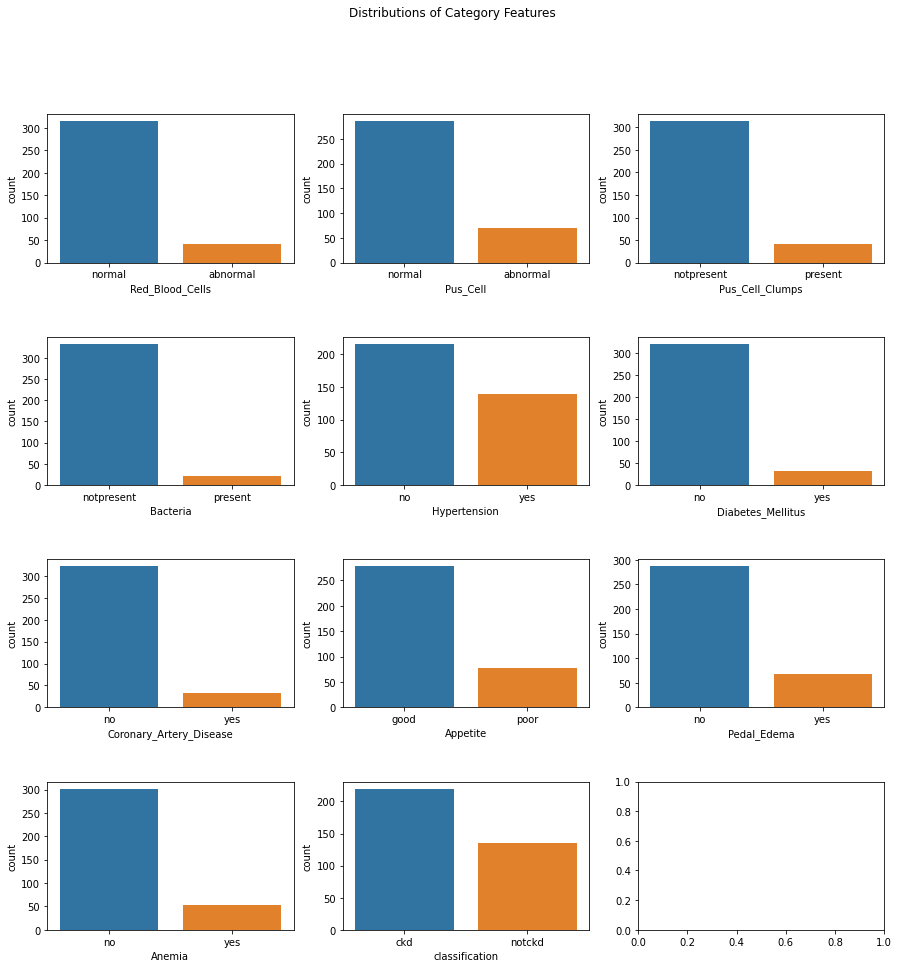

In [25]:
# This code will display the charts of the category features distribuation: 
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of Category Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['object'])):
    sns.countplot(df[feats], ax=ax)

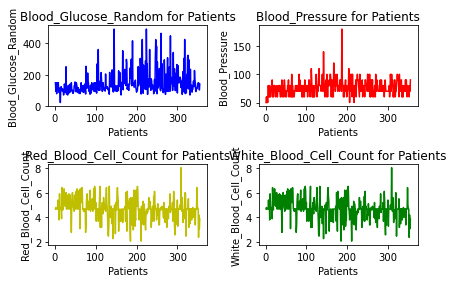

In [26]:
# This code will display the charts for the ratio of the float features among patients:
Patient_figure, Patient_axes = plt.subplots(nrows=2, ncols=2)
Patient = np.linspace(1, 355, 355)

axes1 = Patient_axes[0][0]
axes1.plot(Patient,df['Blood_Glucose_Random'],'b')
axes1.set_xlabel('Patients')
axes1.set_ylabel('Blood_Glucose_Random')
axes1.set_title('Blood_Glucose_Random for Patients')

# Notice that Blood_Pressure has unique values [ 80.  50.  70.  90 , 100.  60. 110. 140. 180. 120.] 
axes2 = Patient_axes[0][1]
axes2.plot(Patient,df['Blood_Pressure'],'r')
axes2.set_xlabel('Patients')
axes2.set_ylabel('Blood_Pressure')
axes2.set_title('Blood_Pressure for Patients')

axes3 = Patient_axes[1][0]
axes3.plot(Patient,df['Red_Blood_Cell_Count'],'y')
axes3.set_xlabel('Patients')
axes3.set_ylabel('Red_Blood_Cell_Count')
axes3.set_title('Red_Blood_Cell_Count for Patients')


axes4 = Patient_axes[1][1]
axes4.plot(Patient,df['White_Blood_Cell_Count'],'g')
axes4.set_xlabel('Patients')
axes4.set_ylabel('White_Blood_Cell_Count')
axes4.set_title('White_Blood_Cell_Count for Patients')

Patient_figure.tight_layout()

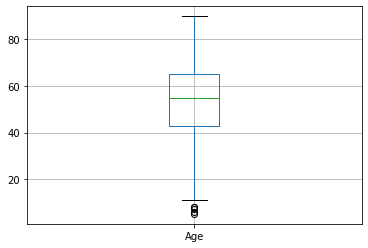

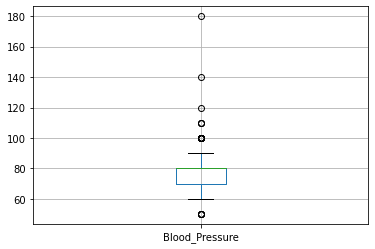

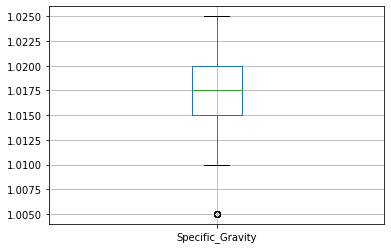

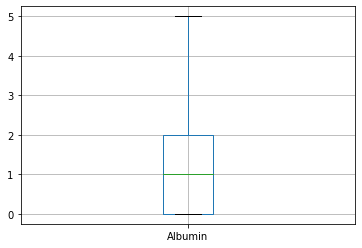

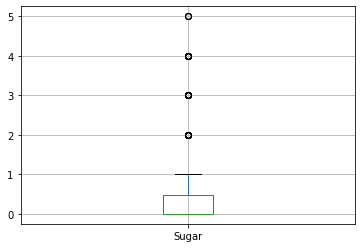

...

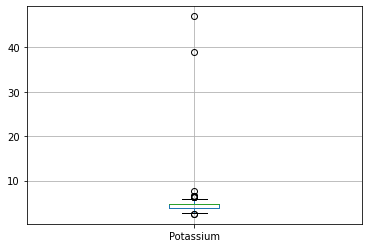

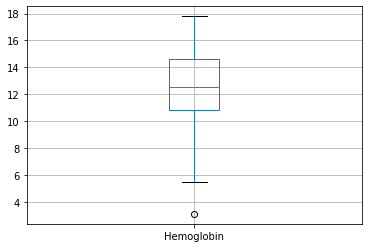

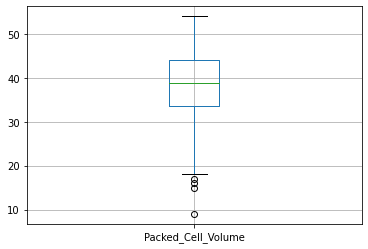

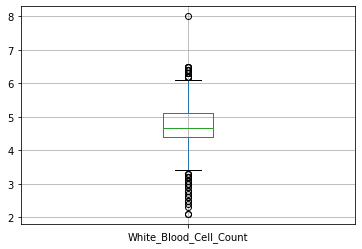

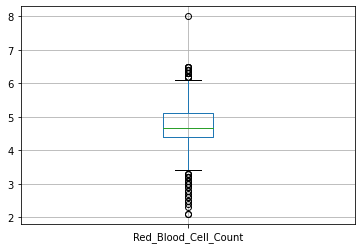

In [27]:
# This code will visualize the numarical features in the dataset: 
for column in df.select_dtypes(include=['float64']):
    plt.figure()
    df.boxplot([column])

### Now, we need to find relation between two features by using correlation.. 

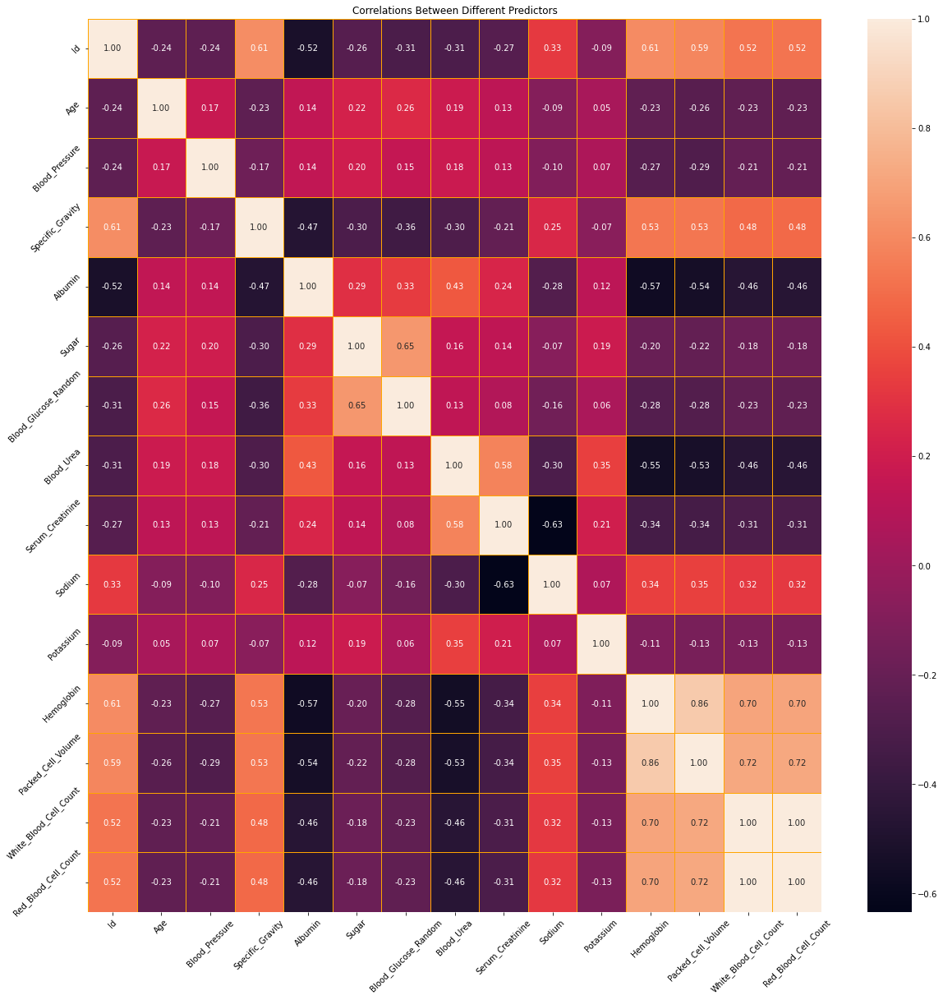

In [28]:
# This code will display the correlation between two features: 
corr_df = df.corr()
f,ax=plt.subplots(figsize=(20,20))
sns.heatmap(corr_df,annot=True,fmt=".2f",ax=ax,linewidths=0.5,linecolor="orange")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.title('Correlations Between Different Predictors')
plt.show()

### Just as we did in the class, we can understand the correlation.. notice the values are almost accurate except for the Red/White_Blood_Cell_Count where the program is confused. 

## Let us display the charts for the positive correlation: 

In [29]:
# This code will display the charts for the positive correlation (Packed_Cell_Volume VS Specific_Gravity): 
fig = px.scatter(df, x="Packed_Cell_Volume", y="Specific_Gravity", color="classification")
fig.show()

In [30]:
# This code will display the charts for the positive correlation (Red_Blood_Cell_Count VS Hemoglobin): 
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="Hemoglobin", color="classification")
fig.show()

In [31]:
# This code will display the charts for the positive correlation (Packed_Cell_Volume VS White_Blood_Cell_Count):
fig = px.scatter(df, x="Packed_Cell_Volume", y="White_Blood_Cell_Count", color="classification")
fig.show() 

In [32]:
# This code will display the charts for the positive correlation (Packed_Cell_Volume VS White_Blood_Cell_Count):
fig = px.scatter(df, x="Packed_Cell_Volume", y="Red_Blood_Cell_Count", color="classification")
fig.show()

In [33]:
# This code will display the charts for the positive correlation (Red_Blood_Cell_Count VS Specific_Gravity):
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="Specific_Gravity", color="classification")
fig.show()

In [34]:
# This code will display the charts for the positive correlation (Red_Blood_Cell_Count VS Hemoglobin):
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="Hemoglobin", color="classification")
fig.show()

In [35]:
# This code will display the charts for the positive correlation (Red_Blood_Cell_Count VS White_Blood_Cell_Count):
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="White_Blood_Cell_Count", color="classification")
fig.show()

In [36]:
# This code will display the charts for the positive correlation (White_Blood_Cell_Count VS Specific_Gravity):
fig = px.scatter(df, x="White_Blood_Cell_Count", y="Specific_Gravity", color="classification")
fig.show()

In [37]:
# This code will display the charts for the positive correlation (White_Blood_Cell_Count VS Hemoglobin):
fig = px.scatter(df, x="White_Blood_Cell_Count", y="Hemoglobin", color="classification")
fig.show()

In [38]:
# This code will display the charts for the positive correlation (Hemoglobin VS Specific_Gravity):
fig = px.scatter(df, x="Hemoglobin", y="Specific_Gravity", color="classification")
fig.show()

In [39]:
# This code will display the charts for the positive correlation (Blood_Glucose_Random VS Sugar):
fig = px.scatter(df, x="Blood_Glucose_Random", y="Sugar", color="classification")
fig.show()

## Now we have looked at the visualization of the positive correlation, let's take a look at the negative correlation.. 

In [40]:
# This code will display the charts for the negative correlation (Packed_Cell_Volume VS Albumin):
fig = px.scatter(df, x="Packed_Cell_Volume", y="Albumin", color="classification")
fig.show()

In [41]:
# This code will display the charts for the negative correlation (Packed_Cell_Volume VS Blood_Urea):
fig = px.scatter(df, x="Packed_Cell_Volume", y="Blood_Urea", color="classification")
fig.show()

In [42]:
# This code will display the charts for the negative correlation (Red_Blood_Cell_Count VS Albumin):
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="Albumin", color="classification")
fig.show()

In [43]:
# This code will display the charts for the negative correlation (Red_Blood_Cell_Count VS Blood_Urea):
fig = px.scatter(df, x="Red_Blood_Cell_Count", y="Blood_Urea", color="classification")
fig.show()

In [44]:
# This code will display the charts for the negative correlation (White_Blood_Cell_Count VS Blood_Urea):
fig = px.scatter(df, x='White_Blood_Cell_Count', y='Blood_Urea', color="classification")
fig.show()

In [45]:
# This code will display the charts for the negative correlation (White_Blood_Cell_Count VS Albumin):
fig = px.scatter(df, x='White_Blood_Cell_Count', y='Albumin', color="classification")
fig.show()

In [46]:
# This code will display the charts for the negative correlation (Hemoglobin VS Blood_Urea):
fig = px.scatter(df, x='Hemoglobin', y='Blood_Urea', color="classification")
fig.show()

In [47]:
# This code will display the charts for the negative correlation (Hemoglobin VS Albumin):
fig = px.scatter(df, x='Hemoglobin', y='Albumin', color="classification")
fig.show()

In [48]:
# This code will display the charts for the negative correlation (Sodium VS Serum_Creatinine):
fig = px.scatter(df, x='Sodium', y='Serum_Creatinine', color="classification")
fig.show()

## After viewing all the possible visualization of the analysis, our next step is to implement statistical analysis.. 

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or 

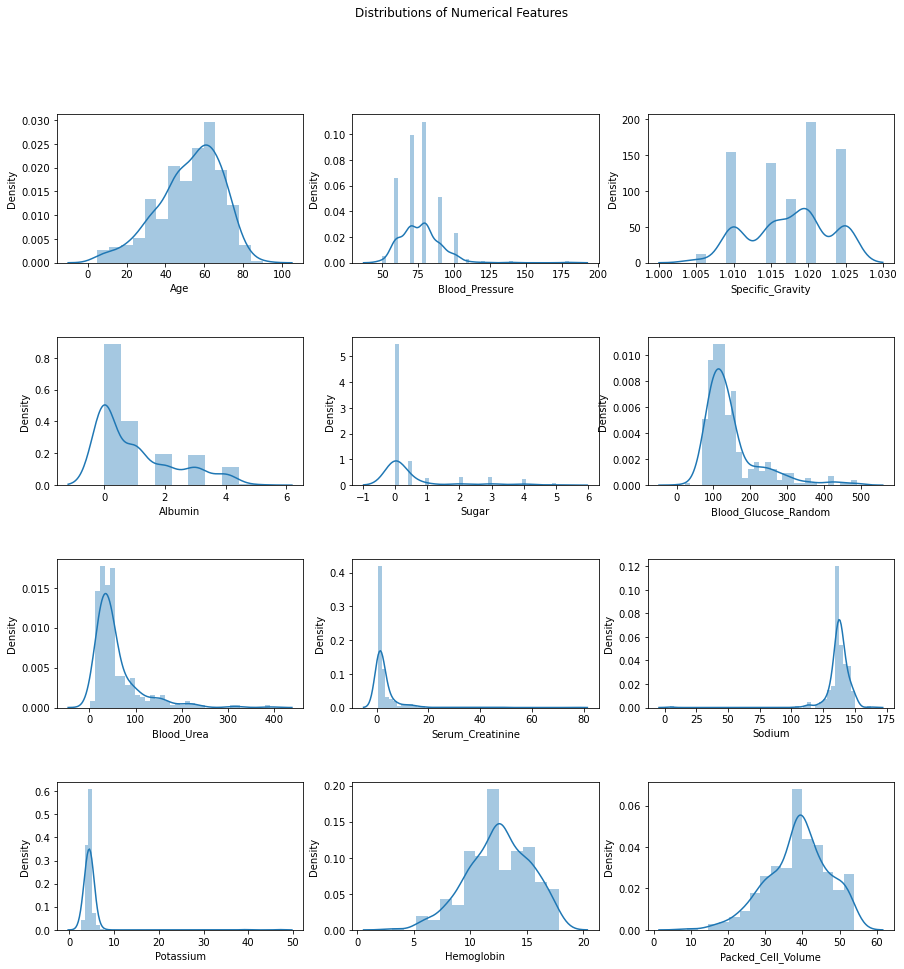

In [49]:
# This code will display the charts for the normal distribution of numerical Features:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15,15))
fig.subplots_adjust(hspace=0.5)
fig.suptitle('Distributions of Numerical Features')


for ax, feats in zip(axes.flatten(), df.select_dtypes(include=['float64'])):
    sns.distplot(a=df[feats], ax=ax)

## Some observations: 

### 1. Age is right skewed
### 2. Blood_Pressure is left skewed
### 3. Specific_Gravity is lightly skewed
### 4. Albumin is left skewed
### 5. Suger is left skewed
### 6. Blood Gluscose Random is left skewed
### 7. Blood_Urea is left skewed
### 8. Serunm Creatinine is left skewed
### 9. Sodium is right skewwd
### 10. Potassium is left skewed
### 11. Hemoglobin is right skewed
### 12. Packed_Cell_Volume is right skewed

## Taking a closer look.. 

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



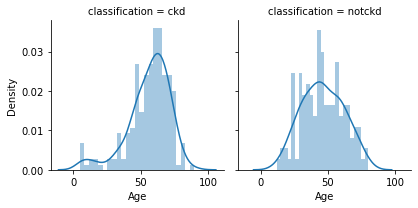

In [50]:
# This code will display the normal distribution of Age for CKD and NOTCKD:
g = sns.FacetGrid(df,col="classification")
g.map(sns.distplot,"Age", bins=25)
plt.show()

In [51]:
# This line will display the variance for numerical features:
np.var(df)

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3619: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Id                        13804.335775
Age                         262.610466
Blood_Pressure              192.895061
Specific_Gravity              0.000029
Albumin                       1.646805
Sugar                         1.108956
Blood_Glucose_Random       5692.355204
Blood_Urea                 2596.429741
Serum_Creatinine             34.192480
Sodium                       93.663822
Potassium                     8.896095
Hemoglobin                    7.508368
Packed_Cell_Volume           67.902992
White_Blood_Cell_Count        0.736801
Red_Blood_Cell_Count          0.736801
dtype: float64

In [52]:
# This line will display the standard deviation for numerical features:
np.std(df)

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3494: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Id                        117.491854
Age                        16.205260
Blood_Pressure             13.888667
Specific_Gravity            0.005375
Albumin                     1.283279
Sugar                       1.053070
Blood_Glucose_Random       75.447698
Blood_Urea                 50.955174
Serum_Creatinine            5.847434
Sodium                      9.678007
Potassium                   2.982632
Hemoglobin                  2.740140
Packed_Cell_Volume          8.240327
White_Blood_Cell_Count      0.858371
Red_Blood_Cell_Count        0.858371
dtype: float64

In [53]:
# This line will display the standard error of the mean for numerical features:
stats.sem(df.select_dtypes(include=['float64']))

array([8.61299875e-01, 7.38174302e-01, 2.85676612e-04, 6.82055152e-02,
       5.59700359e-02, 4.00999993e+00, 2.70823693e+00, 3.10787590e-01,
       5.14380275e-01, 1.58525115e-01, 1.45636805e-01, 4.37968449e-01,
       4.56219034e-02, 4.56219034e-02])

In [54]:
# This line will display the mode:
stats.mode(df)

ModeResult(mode=array([[0, 60.0, 80.0, 1.02, 0.0, 0.0, 'normal', 'normal', 'notpresent',
        'notpresent', 148.1341463414634, 46.0, 1.2, 137.4198606271777,
        4.6520979020979025, 12.525239616613417, 38.841750841750844,
        4.679268292682926, 4.679268292682926, 'no', 'no', 'no', 'good',
        'no', 'no', 'ckd']], dtype=object), count=array([[  1,  17, 108,  93, 175, 256, 314, 285, 313, 333,  27,  14,  37,
         68,  69,  42,  58, 109, 109, 216, 322, 322, 278, 287, 302, 220]]))

In [55]:
# This line will display the harmonic mean:
stats.hmean(df.select_dtypes(include=['float64']))

array([ 42.96719715,  74.46729617,   1.01749554,   0.        ,
         0.        , 124.14892381,  34.40774448,   1.2734962 ,
       126.89427375,   4.34731545,  11.78391576,  36.59108758,
         4.49776996,   4.49776996])

In [56]:
# This line will display the Z-score:
stats.zscore(df.select_dtypes(include=['float64']))

,Age,Blood_Pressure,Specific_Gravity,Albumin,Sugar,Blood_Glucose_Random,Blood_Urea,Serum_Creatinine,Sodium,Potassium,Hemoglobin,Packed_Cell_Volume,White_Blood_Cell_Count,Red_Blood_Cell_Count
131,-2.930539,-1.920707,-1.399814e+00,-0.806466,-4.443662e-01,0.000000,-0.645428,-0.424238,0.000000,2.977834e-16,-2.646725e-01,-0.344859,0.000000,0.000000
190,-2.868830,-1.200695,-1.399814e+00,2.310549,-4.443662e-01,-0.717506,0.178826,-0.355832,-0.250037,8.311521e-02,-9.580677e-01,-1.072985,0.140652,0.140652
1,-2.807122,-1.920707,4.606606e-01,2.310549,-4.443662e-01,0.000000,-0.782803,-0.390035,0.000000,2.977834e-16,-4.471449e-01,-0.102150,0.000000,0.000000
150,-2.745414,-1.200695,1.390898e+00,1.531295,-4.443662e-01,-0.929573,-0.606178,-0.372934,0.000000,2.977834e-16,-8.220004e-02,0.261913,0.000000,0.000000
186,-2.745414,-1.920707,4.606606e-01,2.310549,-4.443662e-01,0.000000,-0.233301,-0.355832,-0.250037,-2.856865e-01,-6.482723e-16,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,1.697588,-0.480684,-1.399814e+00,0.752042,5.271364e-17,0.000000,-0.174426,-0.321629,0.000000,2.977834e-16,-6.482723e-16,0.000000,0.000000,0.000000
160,1.759297,-1.200695,-4.131083e-14,0.000000,5.271364e-17,-0.001778,-0.370677,-0.167715,0.989888,-1.515768e-01,-5.931228e-01,-0.466213,-2.655342,-2.655342
39,1.821005,0.239328,-1.399814e+00,0.752042,1.454843e+00,-0.107812,0.237701,0.054604,-0.146710,-1.515768e-01,1.732614e-01,0.140559,-0.558346,-0.558346
171,1.882713,-0.480684,4.606606e-01,1.531295,-4.443662e-01,-0.611472,0.041450,-0.082208,-2.316578,3.513347e-01,-1.396001e+00,-1.558403,-1.839844,-1.839844


## The following lines will display the probability plots for numerical features:

(array([-2.88603847, -2.59463516, -2.43004007, -2.31295397, -2.22096715,
        -2.14464549, -2.07908848, -2.02141102, -1.96976551, -1.92289476,
        -1.87990311, -1.840129  , -1.8030694 , -1.76833251, -1.73560699,
        -1.70464119, -1.67522863, -1.64719779, -1.6204045 , -1.59472641,
        -1.57005874, -1.54631106, -1.52340473, -1.50127095, -1.47984914,
        -1.45908568, -1.43893287, -1.41934808, -1.40029307, -1.38173334,
        -1.36363774, -1.34597796, -1.32872825, -1.31186509, -1.29536695,
        -1.27921405, -1.26338819, -1.24787258, -1.2326517 , -1.21771116,
        -1.2030376 , -1.18861859, -1.17444257, -1.16049871, -1.1467769 ,
        -1.1332677 , -1.1199622 , -1.10685208, -1.09392949, -1.08118705,
        -1.06861778, -1.05621511, -1.04397282, -1.03188502, -1.01994615,
        -1.00815092, -0.99649431, -0.98497155, -0.9735781 , -0.96230965,
        -0.9511621 , -0.9401315 , -0.92921412, -0.91840639, -0.90770489,
        -0.89710634, -0.88660761, -0.87620571, -0.8

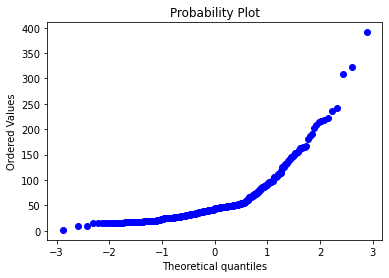

In [57]:
stats.probplot(df['Blood_Urea'], plot=plt , fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

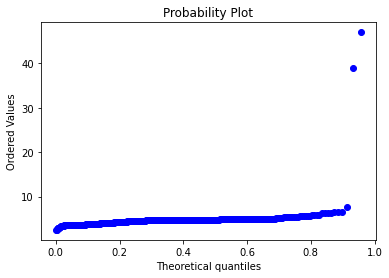

In [58]:
stats.probplot(df['Potassium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

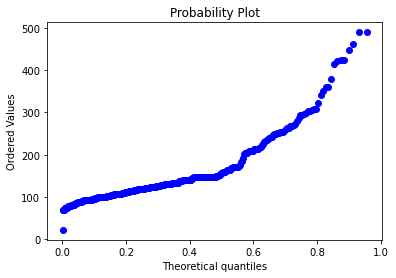

In [59]:
stats.probplot(df['Blood_Glucose_Random'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

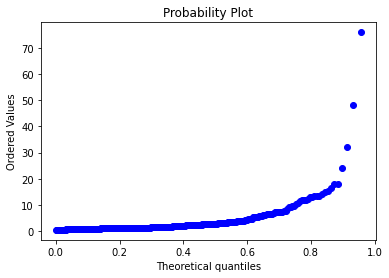

In [60]:
stats.probplot(df['Serum_Creatinine'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

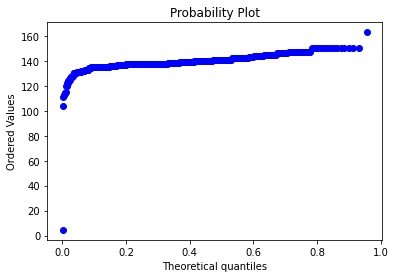

In [61]:
stats.probplot(df['Sodium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

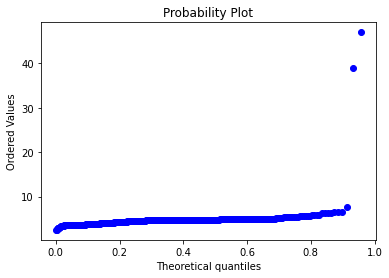

In [62]:
stats.probplot(df['Potassium'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

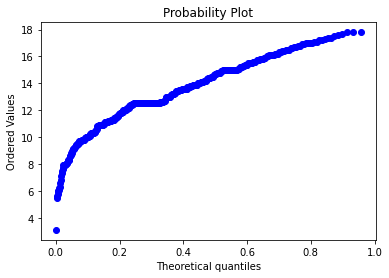

In [63]:
stats.probplot(df['Hemoglobin'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

(array([0.00097579, 0.00237009, 0.00378144, 0.00519479, 0.00661014,
        0.00802752, 0.00944693, 0.01086837, 0.01229186, 0.0137174 ,
        0.01514501, 0.01657469, 0.01800645, 0.0194403 , 0.02087625,
        0.02231431, 0.02375448, 0.02519679, 0.02664123, 0.02808782,
        0.02953657, 0.03098748, 0.03244056, 0.03389584, 0.03535331,
        0.03681298, 0.03827487, 0.03973898, 0.04120533, 0.04267393,
        0.04414478, 0.0456179 , 0.0470933 , 0.04857098, 0.05005097,
        0.05153326, 0.05301787, 0.05450482, 0.0559941 , 0.05748574,
        0.05897975, 0.06047613, 0.06197489, 0.06347606, 0.06497964,
        0.06648563, 0.06799406, 0.06950494, 0.07101827, 0.07253408,
        0.07405236, 0.07557314, 0.07709642, 0.07862222, 0.08015056,
        0.08168143, 0.08321486, 0.08475087, 0.08628945, 0.08783063,
        0.08937442, 0.09092083, 0.09246987, 0.09402156, 0.09557592,
        0.09713295, 0.09869267, 0.10025509, 0.10182024, 0.10338811,
        0.10495873, 0.10653211, 0.10810827, 0.10

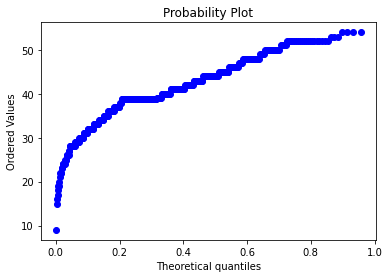

In [64]:
stats.probplot(df['Packed_Cell_Volume'], dist=stats.beta, sparams=(1,2), plot=plt, fit=False)

## Before applying the ML, let's display some important information.. 

In [65]:
# This code will display the unique values of the object features: 
for i in df.select_dtypes(include=['object']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')

Red_Blood_Cells has unique values ['normal' 'abnormal'] 

Pus_Cell has unique values ['normal' 'abnormal'] 

Pus_Cell_Clumps has unique values ['notpresent' 'present'] 

Bacteria has unique values ['notpresent' 'present'] 

Hypertension has unique values ['no' 'yes'] 

Diabetes_Mellitus has unique values ['no' 'yes'] 

Coronary_Artery_Disease has unique values ['no' 'yes'] 

Appetite has unique values ['good' 'poor'] 

Pedal_Edema has unique values ['no' 'yes'] 

Anemia has unique values ['no' 'yes'] 

classification has unique values ['ckd' 'notckd'] 



In [66]:
# This code will convert the category data to numerical so we can apply ML algorithm:
df.Red_Blood_Cells=df.Red_Blood_Cells.map({ 'normal' : 1, 'abnormal' : 0})
df.Pus_Cell=df.Pus_Cell.map({ 'normal' : 1, 'abnormal' : 0})
df.Pus_Cell_Clumps=df.Pus_Cell_Clumps.map({ 'present' : 1, 'notpresent' : 0})
df.Bacteria=df.Bacteria.map({ 'present' : 1, 'notpresent' : 0})
df.Hypertension=df.Hypertension.map({ 'yes' : 1, 'no' : 0})
df.Diabetes_Mellitus=df.Diabetes_Mellitus.map({ 'yes' : 1, 'no' : 0})
df.Coronary_Artery_Disease=df.Coronary_Artery_Disease.map({ 'yes' : 1, 'no' : 0})
df.Appetite=df.Appetite.map({ 'good' : 1, 'poor' : 0})
df.Pedal_Edema=df.Pedal_Edema.map({ 'yes' : 1, 'no' : 0})
df.Anemia=df.Anemia.map({ 'yes' : 1, 'no' : 0})

In [67]:
# This code will display the unique values of the int64 features: 
for i in df.select_dtypes(include=['int64']).columns:
    print('{} has unique values {}'.format(i,df[i].unique()),'\n')

Id has unique values [131 190   1 150 186  47 397 114 387  62 398 102 173 274 282 176 345 270
 355 333 251 365 279 336 339 269  69 166 371 351 361 302 260 368 183 319
 327 292 271 193 354 340 284 329 362 218 304 346 100 122 298 332 167 255
 356 239 224 349 259 360  43 391 343 234 352 348 257  82 314 353 152 287
 250 324  15 212 305 389 296 143 139  24 289 178 258 396 264 308 393 123
 347 330 323 301 342  65 295 337  41 263 181 252 137 108 235  81  40  63
 310 386 163 192 136  71 277 280 307 115 358 326  16  17 273  42 291 278
   0  46   3 245 246  22 382 135  76  83 267 261 196 207 155  98 106 394
  10 265  89 130 254 233   4 309 388 306 390 128 275   8 146  52  50   9
 247 121 174 184 211  44  45  51 109 395 213 281 107 153 303 262 266 313
 118 104 272 154 249  91  99  74  79  86 311 197 384 253 392 145 241 227
 320 376 317 325 399  88 331 229  59 162 159 210  84 380 198 248  49 366
 175 256 206 119  21 147 144 225  18 231   5  96 228 335  33  70 318 182
 205  20  32  25 373 338 157 3

In [68]:
# Let's take a look at the dataset information one more time: 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 355 entries, 131 to 200
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Id                       355 non-null    int64  
 1   Age                      355 non-null    float64
 2   Blood_Pressure           355 non-null    float64
 3   Specific_Gravity         355 non-null    float64
 4   Albumin                  355 non-null    float64
 5   Sugar                    355 non-null    float64
 6   Red_Blood_Cells          355 non-null    int64  
 7   Pus_Cell                 355 non-null    int64  
 8   Pus_Cell_Clumps          355 non-null    int64  
 9   Bacteria                 355 non-null    int64  
 10  Blood_Glucose_Random     355 non-null    float64
 11  Blood_Urea               355 non-null    float64
 12  Serum_Creatinine         355 non-null    float64
 13  Sodium                   355 non-null    float64
 14  Potassium               

## Note that the only object feature that we have not modify is the classification which has the values of ['ckd' 'nckd']

# Now, after completing all our analysis.. we can move on to applying ML algorthims. In this part, we need to apply many algorthims to find the best fit for our project. We will apply KNN algorthim, Logistic Regression algorthim, and Random Forest Classifier algorthim. 

## We choose these algorthims based on an expert advise, we studied them, and as will be seen, we implemented them to our project. 

# KNN algorthim

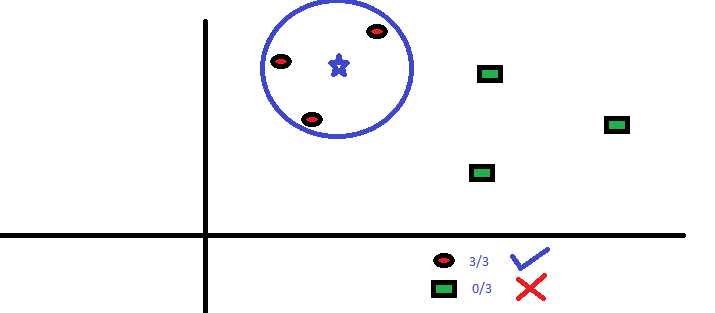

# In order to implement this algorthim, we had to drop three of our features: 

## 1. ID: 
### ID is a representation of the row the where we can find the data. 

## 2. classification: 
### This is the target.

## 3. Sugar:
### After a discussion with some medical students, we found that this features has nothing to do with CKD. Thus, we decided not to put it in training so that the accuracy of the model's prediction is not affected.

In [69]:
# This code will define x and y to drop the three features:
X = df.drop(['classification','Id','Sugar'], axis=1)
y = df['classification']

# This line will define the training and testing sets: 
# We used the most common appropriate split ration (80% train / 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# This code will fit the KNN model: 
knn = KNeighborsClassifier(n_neighbors=1) 
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

[[45  5]
 [ 3 18]]


<AxesSubplot:>

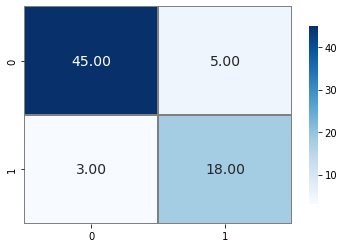

In [70]:
# This code will use the .predict() method to make predictions from the X_test subset:
preds = knn.predict(X_test)

# This code will display the chart for the test classification results: 
matrix = confusion_matrix(y_test, preds, labels=y.unique(), normalize=None)
print(matrix)

sns.heatmap(matrix, annot=True,  
                  annot_kws={"size": 14},
                  fmt='.2f', cmap="Blues", cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [71]:
# This line will display the classification result of the test dataset:
print(classification_report(preds, y_test))

              precision    recall  f1-score   support

         ckd       0.90      0.94      0.92        48
      notckd       0.86      0.78      0.82        23

    accuracy                           0.89        71
   macro avg       0.88      0.86      0.87        71
weighted avg       0.89      0.89      0.89        71



[0.888 0.865 0.892 0.883 0.889 0.878 0.879 0.886 0.886 0.897 0.883 0.882
 0.876 0.879 0.872 0.879 0.869 0.879 0.865 0.876 0.869 0.865 0.858 0.858
 0.855 0.855 0.845 0.855 0.851 0.855 0.841 0.851 0.844 0.855 0.848 0.851
 0.841 0.844 0.834 0.844 0.837 0.844 0.841 0.844 0.837 0.841 0.841 0.841
 0.837]


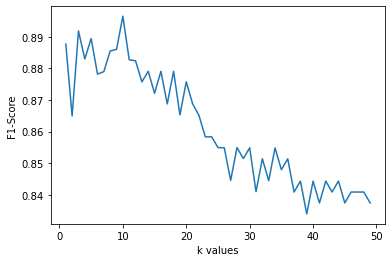

In [72]:
# This code will plot the K values VS F1-score:
from sklearn import metrics
k_range=list(range(1,50))
k_scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    scores=cross_val_score(knn, X_train, y_train,cv=5, scoring='f1_macro')  # or ‘f1_micro’, ‘f1_weighted’
    k_scores.append(scores.mean())
print(np.round(k_scores,3)) # to display scores to 3 decimal places
                                                                          
plt.plot(k_range,k_scores)
plt.xlabel('k values')
plt.ylabel('F1-Score')
plt.show()

In [73]:
# This line will display the prediction:
preds

array(['notckd', 'ckd', 'ckd', 'notckd', 'ckd', 'ckd', 'notckd', 'ckd',
       'ckd', 'ckd', 'ckd', 'ckd', 'ckd', 'ckd', 'notckd', 'ckd',
       'notckd', 'ckd', 'notckd', 'ckd', 'ckd', 'notckd', 'ckd', 'notckd',
       'ckd', 'ckd', 'notckd', 'ckd', 'notckd', 'ckd', 'ckd', 'notckd',
       'ckd', 'ckd', 'ckd', 'notckd', 'ckd', 'ckd', 'ckd', 'ckd', 'ckd',
       'ckd', 'ckd', 'notckd', 'notckd', 'ckd', 'notckd', 'ckd', 'notckd',
       'ckd', 'ckd', 'notckd', 'notckd', 'ckd', 'ckd', 'ckd', 'ckd',
       'ckd', 'notckd', 'ckd', 'ckd', 'notckd', 'notckd', 'ckd', 'ckd',
       'ckd', 'ckd', 'notckd', 'notckd', 'ckd', 'ckd'], dtype=object)

Text(0, 0.5, 'Error Rate')

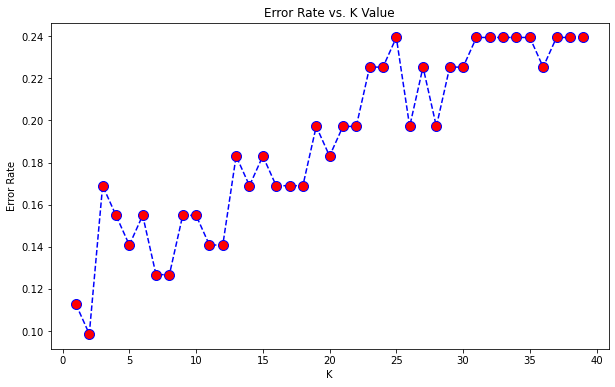

In [74]:
# This code will look for the best value of K:
error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train , y_train)
    predicts_i = knn.predict(X_test)
    error_rate.append(np.mean(predicts_i != y_test))
    
# This code will display the error rate VS K value:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [75]:
# This code will display the accuracy of the KNN algorthim: 
print('Accuracy: %3f' % accuracy_score(y_test, preds))

Accuracy: 0.887324


### Now we have the results of KNN algorthim, let's evaluate it..

In [76]:
X1 = df.drop(['classification','Id','Sugar'], axis=1)
df.classification=df.classification.map({ 'ckd' : 1, 'notckd' : 0})
y1 = df['classification']

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2)

y1

131    1
190    1
1      1
150    1
186    1
      ..
194    1
160    1
39     1
171    1
200    1
Name: classification, Length: 355, dtype: int64

In [77]:
# This line will display the dimention of the x training set:
X1_train['Albumin'].ndim

1

In [78]:
# This line will display the shape of the x trainging set: 
X1_train['Albumin'].shape

(284,)

In [79]:
# This line will display the dimention of the y training set: 
y1_train.ndim

1

In [80]:
# This line will display shape of the y training set: 
y1_train.shape

(284,)

In [81]:
# This code will reshape the the training set to find the coff. and intercept: 
from sklearn import linear_model


regr1 = linear_model.LinearRegression()
train_x1 =X1_train['Albumin'].values.reshape(-1, 1)
train_y1 = y1_train.values.reshape(-1, 1)
regr1.fit (train_x1, train_y1)

# This code will display the coefficient and the intercept:
print ('Coefficients: ', regr1.coef_)
print ('Intercept: ',regr1.intercept_)

Coefficients:  [[0.22419938]]
Intercept:  [0.39423077]


In [82]:
# This line will display the y training set shape:
y_train.shape

(284,)

Text(0, 0.5, 'Sugar')

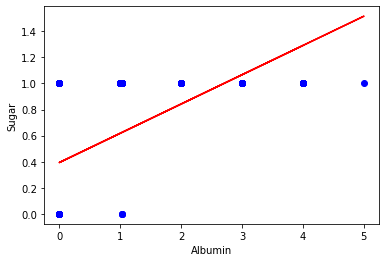

In [83]:
# This code will display a graph between the Albumin data and the Sugar data: 
plt.scatter(train_x1, train_y1,  color='blue')
plt.plot(train_x1, regr1.coef_[0][0]*train_x1 + regr1.intercept_[0], '-r')
plt.xlabel("Albumin")
plt.ylabel("Sugar")

In [84]:
regr1.coef_[0][0]

0.22419938039302306

In [85]:
# This code will display the mean absolute error, the mean squared error, and the root mean squared:
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import mean_absolute_error 
import math
from sklearn.metrics import r2_score


test_x1 =X1_test['Albumin'].values.reshape(-1, 1)
test_y1= y1_test.values.reshape(-1, 1)
test_y_hat = regr1.predict(test_x1)


MAE = mean_absolute_error(test_y1, test_y_hat)
print("Mean absolute error: %.2f" % MAE)

MSE =mean_squared_error(test_y1, test_y_hat)
print("Mean Squared Error:%.2f" %MSE)

RMSE = math.sqrt(MSE)
print("Root Mean Squared Error:%.2f" %RMSE)

print("R2-score: %.2f" % r2_score(test_y1, test_y_hat) )

Mean absolute error: 0.35
Mean Squared Error:0.14
Root Mean Squared Error:0.38
R2-score: 0.41


Text(0, 0.5, 'Hemoglobin')

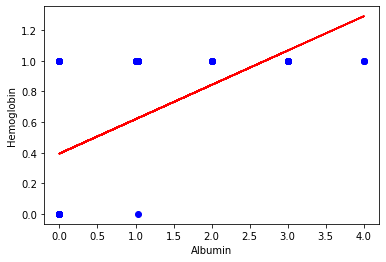

In [86]:
# This code will display a graph between the Albumin data and the Hemoglobin data: 
plt.scatter(test_x1, test_y1,  color='blue')
plt.plot(test_x1, regr1.coef_[0][0]*test_x1+ regr1.intercept_[0], '-r')
plt.xlabel("Albumin")
plt.ylabel("Hemoglobin")

# Let's do cross validation  to ensure our results..

[0.888 0.865 0.892 0.883 0.889 0.878 0.879 0.886 0.886 0.897 0.883 0.882
 0.876 0.879 0.872 0.879 0.869 0.879 0.865 0.876 0.869 0.865 0.858 0.858
 0.855 0.855 0.845 0.855 0.851 0.855 0.841 0.851 0.844 0.855 0.848 0.851
 0.841 0.844 0.834 0.844 0.837 0.844 0.841 0.844 0.837 0.841 0.841 0.841
 0.837]


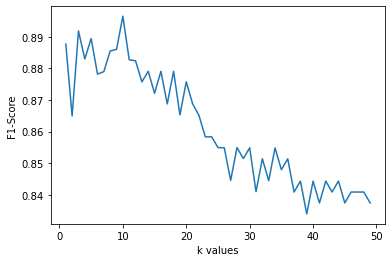

In [87]:
# This code will display a graph between the K value and the F1-Score: 
from sklearn import metrics
k_range=list(range(1,50))
k_scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    scores=cross_val_score(knn, X_train, y_train,cv=5, scoring='f1_macro')  # or ‘f1_micro’, ‘f1_weighted’
    k_scores.append(scores.mean())
print(np.round(k_scores,3)) # to display scores to 3 decimal places
                                                                          
plt.plot(k_range,k_scores)
plt.xlabel('k values')
plt.ylabel('F1-Score')
plt.show()

In [88]:
# This code find and display the optimal K value:
optimal_k = k_range[k_scores.index(max(k_scores))]
print("Optimal K: ", optimal_k)

Optimal K:  10


[[42  8]
 [ 3 18]]


<AxesSubplot:>

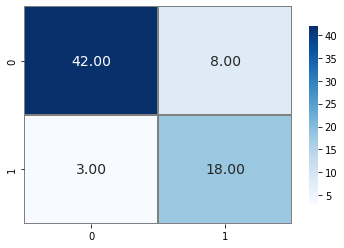

In [89]:
# The following code will implement the new optimal K value to our testing data and do steps similar to the ones
# we did in testing: 
knn_optimal = KNeighborsClassifier(n_neighbors=6) 
knn_optimal.fit(X_train, y_train)
preds = knn_optimal.predict(X_test)


matrix = confusion_matrix(y_test, preds, labels=y.unique(), normalize=None)
print(matrix)

sns.heatmap(matrix, annot=True,  
                  annot_kws={"size": 14},
                  fmt='.2f', cmap="Blues", cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [90]:
print(classification_report(preds, y_test))

              precision    recall  f1-score   support

         ckd       0.84      0.93      0.88        45
      notckd       0.86      0.69      0.77        26

    accuracy                           0.85        71
   macro avg       0.85      0.81      0.83        71
weighted avg       0.85      0.85      0.84        71



In [91]:
print('Accuracy: %3f' % accuracy_score(y_test, preds))

Accuracy: 0.845070


# Now we have our final results using KNN algorthim, let's go ahead and try the Logistic Regression algorthim..

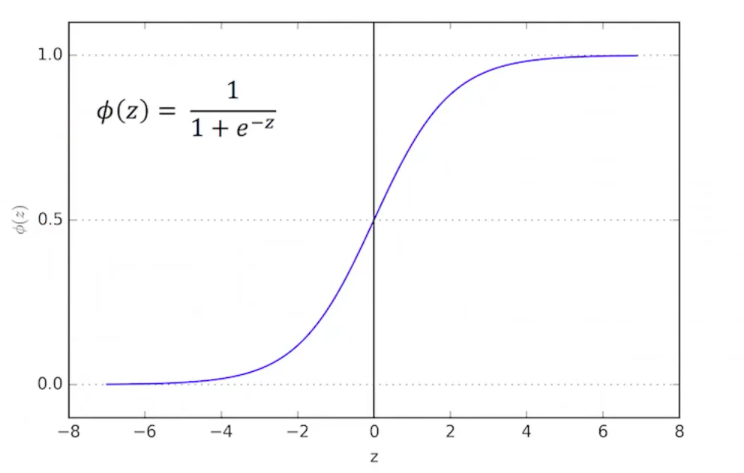

In [92]:
# The comments to the following codes are somehow repeated above.. 

In [93]:
logmodel = LogisticRegression()

In [94]:
logmodel.fit(X_train,y_train)

/Users/meshari/opt/anaconda3/envs/tensorflow/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [95]:
predictions = logmodel.predict(X_test)

In [96]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

         ckd       0.98      1.00      0.99        50
      notckd       1.00      0.95      0.98        21

    accuracy                           0.99        71
   macro avg       0.99      0.98      0.98        71
weighted avg       0.99      0.99      0.99        71



In [97]:
print('Accuracy: %3f' % accuracy_score(y_test, predictions))

Accuracy: 0.985915


<AxesSubplot:>

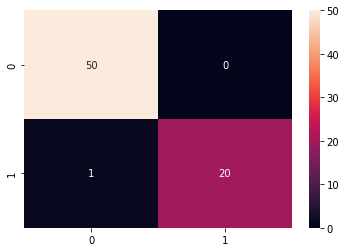

In [98]:
ConM=confusion_matrix(y_test, predictions)
sns.heatmap(ConM,annot=True)

# Having accuracy of 100% using this algorthim gives a perfect methode to conclude our project work.. However, we will try the last algorthim just to examine it and see what kind of results we might have..

# Let's try now the Random Forest Classifier algorthim

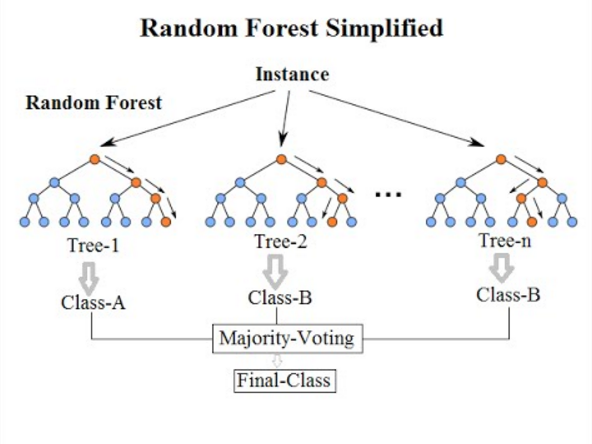

In [99]:
modelRF = RandomForestClassifier()

In [100]:
modelRF.fit(X_train, y_train)

RandomForestClassifier()

In [101]:
y_predrf = modelRF.predict(X_test)

In [102]:
print(classification_report(y_test,y_predrf))

              precision    recall  f1-score   support

         ckd       1.00      1.00      1.00        50
      notckd       1.00      1.00      1.00        21

    accuracy                           1.00        71
   macro avg       1.00      1.00      1.00        71
weighted avg       1.00      1.00      1.00        71



<AxesSubplot:>

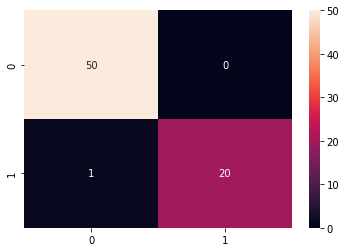

In [103]:
ConMR=confusion_matrix(y_test, y_predrf)
sns.heatmap(ConM,annot=True)

In [104]:
print('Accuracy: %3f' % accuracy_score(y_test, y_predrf))

Accuracy: 1.000000


# RESULTS

### In this study, 26 data recording information of 355 people such as Age, Blood_Pressure, Specific_Gravity, Blood_Urea and others were used as attributes. Clinical records were examined to determine whether CKD was present or not and provided a high accuracy rate with machine learning methods.
### In the study, three different classifiers were utilized in determining the targeted CKD and the best performing classifier was found by trial and error. These algorithms were compared on the basis of accuracy rate, sensitivity to testing datasets, recall and f1 score. When the results were evaluated with the data used in this study, it was seen that the Logistic Regression algorthim without cross validation performed better than other classification algorithms.
### Machine learning tools can be used for timely and accurate diagnosis of CKD, helping doctors confirm their diagnostic findings in a relatively short time, thereby helping a doctor to look and diagnose more patients in less time. In future studies, it may be possible to use different algorithms, such as deep learning methods, to predict CKD.

# This project is done by Meshari Alkhaldi and Bandar Alsuhaibani as a requirement of the course CISE483 for the term 211 and Dr. Khaled Alshehri

### A special thanks for our ML experts who helped us a lot during this project